In [10]:
import sys

sys.path.append('/mnt/raid/C1_ML_Analysis/source/blender/famli-ultra-sim/dl')

import os
import pandas as pd
import numpy as np 

import torch
from torch import nn
from torch.utils.data import DataLoader
import torch.optim as optim
# import torch.nn.functional as F

from torchvision import transforms as T
from torchvision.transforms import functional as F

from loaders.ultrasound_dataset import LotusDataset
from transforms.ultrasound_transforms import LotusEvalTransforms
import monai
from callbacks import logger as LOGGER

from nets import lotus
import SimpleITK as sitk

import pickle

import nrrd

import plotly
import plotly.express as px
import plotly.graph_objects as go

from generative.networks import nets as nets_generative
from generative.networks.schedulers import DDPMScheduler, DDIMScheduler
from generative.inferers import LatentDiffusionInferer, DiffusionInferer

In [12]:
def pad_and_crop(image, pad_height=0, pad_bottom=0):
    """
    Pads the image with N pixels on top and then crops it back to the original size.

    :param image: NumPy array representing the image.
    :param pad_height: Number of pixels to pad on the top.
    :return: The padded and cropped image.
    """
    # Pad the image
    padded_image = np.pad(image, ((pad_bottom, pad_height), (0, 0)), mode='constant', constant_values=0)

    # Crop the image back to original size
    if pad_bottom > 0:
        cropped_image = padded_image[pad_height:-pad_bottom, :]
    else:
        cropped_image = padded_image[pad_height:, :]

    return cropped_image

class PadAndCrop:

    """
    Pad the image with specified pixels on top and bottom, 
    and then crop it back to the original size.
    """

    def __init__(self, pad_height=0, pad_bottom=0):
        """
        :param pad_height: Number of pixels to pad on the top.
        :param pad_bottom: Number of pixels to pad on the bottom.
        """
        self.pad_height = pad_height
        self.pad_bottom = pad_bottom

    def __call__(self, img):
        """
        :param img: PIL Image or Tensor to be padded and cropped.
        :return: Padded and cropped image. (padding_left,padding_right, padding_top,padding_bottom)padding_top,padding_bottom)
        """
        # Pad the image
        img_padded = F.pad(img, (0, self.pad_bottom, 0, self.pad_height), padding_mode='constant', fill=0)
        _, _, h, w = img.shape
        
        # return img_padded
        
        return F.crop(img_padded, top=self.pad_height, left=0, height=h, width= w) 

In [3]:

NN = getattr(lotus, 'UltrasoundRendering')    
model = NN.load_from_checkpoint('/mnt/raid/C1_ML_Analysis/train_output/ultra-sim/rendering/v0.1/epoch=199-val_loss=0.04.ckpt')
model.eval()

UltrasoundRendering(
  (loss): L1Loss()
)

In [4]:
df = pd.read_csv('/mnt/raid/C1_ML_Analysis/source/blender/simulated_data_export/CSV_files/label_diffusor.csv')
mount_point = '/mnt/raid/C1_ML_Analysis/source/blender/simulated_data_export'
img_column = 'img_path'
seg_column = 'seg_path'


valid_transform = LotusEvalTransforms()

test_ds = monai.data.Dataset(data=LotusDataset(df, mount_point, img_column=img_column, seg_column=seg_column), transform=valid_transform)

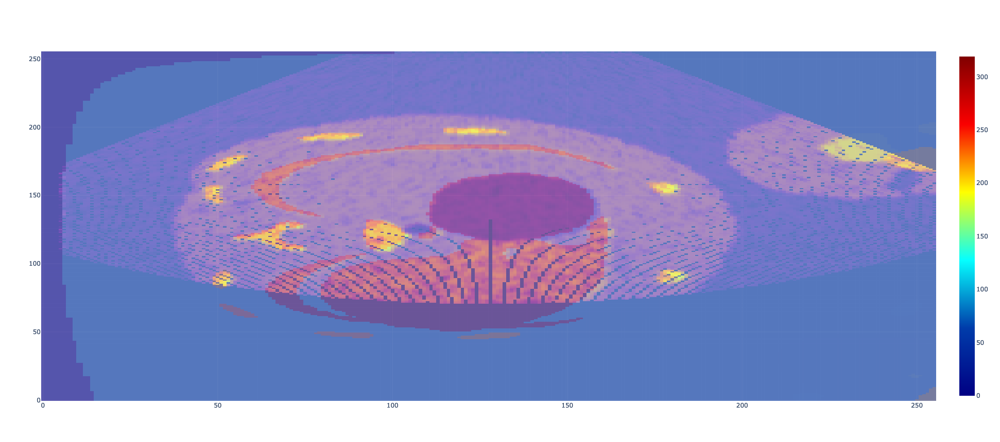

In [5]:


img_d = test_ds[10]

img = img_d['img']
seg = img_d['seg']

fake_us = model(seg[None])[0]

fig = go.Figure()
# fig.add_trace(go.Heatmap(z=np.flip(img.detach().numpy().squeeze(), axis=0), colorscale='gray', showscale=False, opacity=0.3))
fig.add_trace(go.Heatmap(z=np.flip(seg.detach().numpy().squeeze(), axis=0), colorscale='jet', opacity=0.3))
fig.add_trace(go.Heatmap(z=np.flip(fake_us.detach().numpy().squeeze(), axis=0), showscale=False, opacity=0.5))

fig.update_layout(
            autosize=False,
            width=860,
            height=860
        )

fig

In [56]:
fn_arr = ["/mnt/raid/C1_ML_Analysis/source/blender/simulated_data_export/FAM-025-1144-4_20201007_033352_split_frames/AC/229.nrrd",
    "/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-05/FAM-202-2497-1_20220519_055253/2815d5fd-6756-4ffb-abf3-d5e24000782b/107.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-04/FAM-025-2072-2_20220425_074330/ad28c0c0-193a-4ac9-b75d-56644266fdb5/141.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-05/FAM-202-2475-1_20220510_035657/1b10dae5-9989-43e5-ad5e-d46ad36dc981/201.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-05/UNC-0898-6_20220503_100714/6c9381e6-cbfa-4d72-84ff-8b929b0f47b9/15.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-04/UNC-0884-5_20220426_104237/567dff98-921d-4ae0-bee1-3a6da8b49101/129.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-05/UNC-0927-3_20220511_093711/034c41e0-609c-4b08-a0ed-245e92595c8e/171.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-05/FAM-202-2406-2_20220524_062717/747ab498-475c-45c2-8350-01dd047e8587/181.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-04/FAM-025-2071-1_20220405_053447/0e95c492-24aa-4134-9645-076e15200844/377.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-04/FAM-202-2456-1_20220427_041151/9b3c6a57-7a73-40c8-9377-3f858776d67a/108.nrrd",
"/mnt/raid/C1_ML_Analysis/extract_frames_blind_sweeps/Dataset_C_masked_resampled_256_spc075/2022-05/FAM-025-2118-1_20220518_040716/7e60e8f9-f865-4fce-8f89-82b24da8929c/67.nrrd"]

t = T.Compose([PadAndCrop(pad_bottom=40), T.Resize(128)])
t_ = T.Compose([PadAndCrop(pad_bottom=40)])

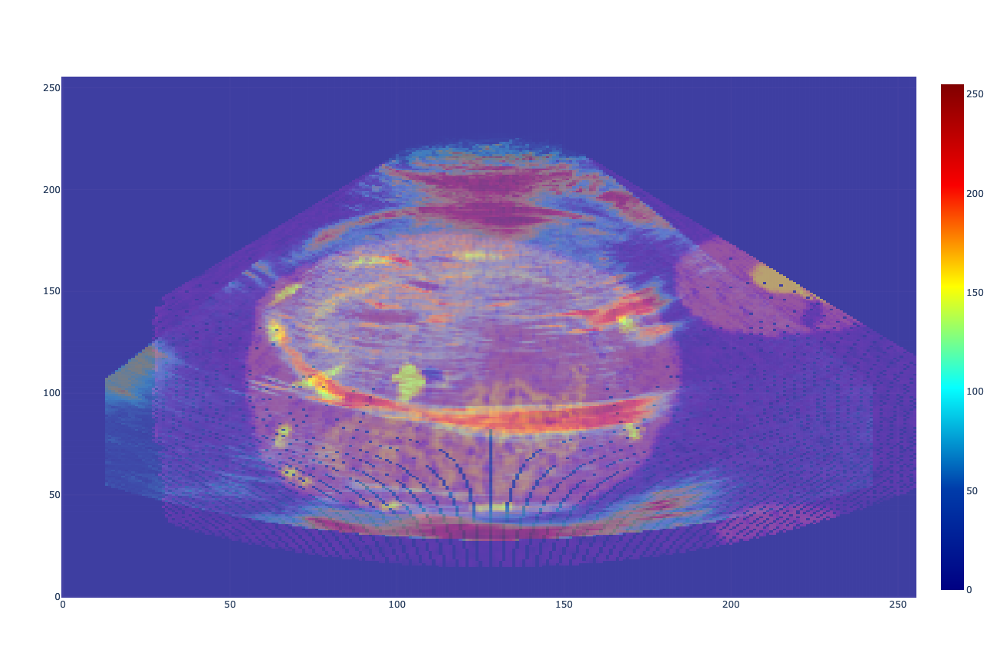

In [59]:
model2 = NN(num_labels=model.hparams.num_labels, grid_w=256, grid_h=256, center_x=128, center_y=-30, r1=20, r2=230, theta=np.pi/4, alpha_coeff_boundary_map=model.hparams.alpha_coeff_boundary_map, tgc=model.hparams.tgc, beta_coeff_scattering=model.hparams.beta_coeff_scattering)
model2.acoustic_impedance_dict = model.acoustic_impedance_dict
model2.attenuation_dict = model.attenuation_dict
model2.mu_0_dict = model.mu_0_dict
model2.mu_1_dict = model.mu_1_dict
model2.sigma_0_dict = model.sigma_0_dict
model2.eval()

# img_np, head = nrrd.read(os.path.join(mount_point, 'FAM-202-1960-2_20211019_033119_split_frames/BPD/118.nrrd'), index_order='C')

img_np = sitk.GetArrayFromImage(sitk.ReadImage(fn_arr[0]))

img_d = test_ds[10]

img = img_d['img']
seg = img_d['seg']

fake_us = model2(seg[None])

fig = go.Figure()
# fig.add_trace(go.Heatmap(z=np.flip(img.detach().numpy().squeeze(), axis=0), colorscale='gray', showscale=False, opacity=0.3))
# fig.add_trace(go.Heatmap(z=np.flip(seg.detach().numpy().squeeze(), axis=0), colorscale='jet', opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(img_np[:,:,0], axis=0), colorscale='jet', opacity=0.5))
# fig.add_trace(go.Heatmap(z=np.flip(fake_us.detach().numpy().squeeze(), axis=0), showscale=False, opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(t_(fake_us).detach().numpy().squeeze(), axis=0), showscale=False, opacity=0.5))



fig.update_layout(
            autosize=False,
            width=860,
            height=860
        )

fig

In [ ]:
fig = go.Figure()
# fig.add_trace(go.Heatmap(z=np.flip(img.detach().numpy().squeeze(), axis=0), colorscale='gray', showscale=False, opacity=0.3))
# fig.add_trace(go.Heatmap(z=np.flip(seg.detach().numpy().squeeze(), axis=0), colorscale='jet', opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(pad_and_crop(img_np[:,:,0], pad_height=40), axis=0), colorscale='jet', opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(fake_us.detach().numpy().squeeze(), axis=0), showscale=False, opacity=0.4))


fig.update_layout(
            autosize=False,
            width=860,
            height=860
        )

fig

In [ ]:
fig = go.Figure()
# fig.add_trace(go.Heatmap(z=np.flip(img.detach().numpy().squeeze(), axis=0), colorscale='gray', showscale=False, opacity=0.3))
# fig.add_trace(go.Heatmap(z=np.flip(seg.detach().numpy().squeeze(), axis=0), colorscale='jet', opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(img_np[:,:,0], axis=0), colorscale='jet', opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(pad_and_crop(fake_us.detach().numpy().squeeze(), pad_bottom=40), axis=0), showscale=False, opacity=0.5))


fig.update_layout(
            autosize=False,
            width=860,
            height=860
        )

fig

In [ ]:
fig = go.Figure()
# fig.add_trace(go.Heatmap(z=np.flip(img.detach().numpy().squeeze(), axis=0), colorscale='gray', showscale=False, opacity=0.3))
# fig.add_trace(go.Heatmap(z=np.flip(seg.detach().numpy().squeeze(), axis=0), colorscale='jet', opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(img_np[:,:,0], axis=0), colorscale='jet', opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(t_(fake_us).detach().numpy().squeeze(), axis=0), showscale=False, opacity=0.4))


fig.update_layout(
            autosize=False,
            width=860,
            height=860
        )

fig

In [ ]:
from nets import diffusion


NND = getattr(diffusion, 'Diffusion_AE')
model_diff = NND.load_from_checkpoint('/mnt/raid/C1_ML_Analysis/train_output/diffusionAE/NOFLYTO/v0.4/epoch=74-val_loss=0.01.ckpt')


In [ ]:
# Define a simple neural network with one linear layer
class LatentParamsNet(torch.nn.Module):
    def __init__(self, latent_dim=256, timesteps=100):
        super(LatentParamsNet, self).__init__()
        self.latent = torch.nn.Parameter(torch.rand(1, latent_dim))    # Z in MRayl
        
        self.scheduler = DDIMScheduler()
        self.scheduler.set_timesteps(num_inference_steps=timesteps)        
        self.inferer = DiffusionInferer(self.scheduler)
        
        # self.unet = nets_generative.DiffusionModelUNet(
        #             spatial_dims=2,
        #             in_channels=3,
        #             out_channels=3,
        #             num_channels=(128, 256, 256),
        #             attention_levels=(False, True, True),
        #             num_res_blocks=1,
        #             num_head_channels=64,
        #             with_conditioning=True,
        #             cross_attention_dim=1,
        #         )

    def forward(self, x, timesteps=100):
        noise = torch.rand_like(x)
        
        # with torch.no_grad():
        # output = self.inferer.sample(input_noise=noise, diffusion_model=self.unet, scheduler=self.scheduler, save_intermediates=False, conditioning=self.latent.unsqueeze(2).clone().detach(), verbose=False)
        for t in range(timesteps):
            # 1. predict noise model_output
            model_output = self.unet(
                image, timesteps=torch.Tensor((t,)).to(noise.device), context=self.latent
            )
            # 2. compute previous image: x_t -> x_t-1
            image, _ = scheduler.step(model_output, t, image)
        return image
        


# Initialize the model
latent_params = LatentParamsNet()
latent_params.semantic_encoder = model_diff.semantic_encoder
latent_params.unet = model_diff.unet
latent_params.cuda()
latent_params.unet.eval()

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(latent_params.parameters(), lr=0.01)

# Training loop
t_c = t(fake_us).cuda()
for epoch in range(20):  # loop over the dataset multiple times
    optimizer.zero_grad()  # zero the parameter gradients

    # Forward pass
    outputs = latent_params(t_c)
    loss = criterion(outputs, t_c)

    # Backward pass and optimize
    loss.backward(retain_graph=True)
    optimizer.step()

    print(f'Epoch {epoch+1}, Loss: {loss.item()}')

print('Finished Training')

In [ ]:
latent_params.eval()
outputs = latent_params(t(fake_us).cuda())

In [ ]:
fig = go.Figure()
# fig.add_trace(go.Heatmap(z=np.flip(img.detach().numpy().squeeze(), axis=0), colorscale='gray', showscale=False, opacity=0.3))
# fig.add_trace(go.Heatmap(z=np.flip(seg.detach().numpy().squeeze(), axis=0), colorscale='jet', opacity=0.5))
# fig.add_trace(go.Heatmap(z=np.flip(img_np[:,:,0], axis=0), colorscale='jet', opacity=0.5))
fig.add_trace(go.Heatmap(z=np.flip(outputs.detach().cpu().numpy().squeeze(), axis=0), showscale=False, opacity=0.4))


fig.update_layout(
            autosize=False,
            width=860,
            height=860
        )

fig

In [49]:

# fn = "/mnt/raid/C1_ML_Analysis/CSV_files/extract_frames_Dataset_C_masked_resampled_256_spc075_wscores_meta_noflyto_1e-4.parquet"
# df = pd.read_parquet(fn)
# df.columns
# df_8mo = df.query('215 < ga_boe')

# df_8mo.to_parquet(fn.replace('.parquet', '-7mo-9mo.parquet'))

In [48]:
df_8mo

,img_path,study_id_x,score,pred,id,file_path,type,tag,n_rows,n_columns,...,ga_absdiff,unc_edd_uncertain,ga_boe_w,is_ga_anchor,ga_presentation_w,ga_presentation,placenta_str,previa_str,fetal_presentation_str,efw_Hadlock_IV
9603,extract_frames_blind_sweeps/Dataset_C_masked_r...,FAM-025-2005-2,0.001743,161.686691,c5d71731-fe87-413f-9ecd-ddd77d4f551a,Dataset_C_masked_resampled_256_spc075/2022-04/...,cine,R1,560.0,644.0,...,0.050111,NaN,33.437629,0.0,23.009057,161.0634,Anterior,Normal,Cephalic,2184.542559
9604,extract_frames_blind_sweeps/Dataset_C_masked_r...,FAM-025-2005-2,0.043671,160.285919,c5d71731-fe87-413f-9ecd-ddd77d4f551a,Dataset_C_masked_resampled_256_spc075/2022-04/...,cine,R1,560.0,644.0,...,0.050111,NaN,33.437629,0.0,23.009057,161.0634,Anterior,Normal,Cephalic,2184.542559
9605,extract_frames_blind_sweeps/Dataset_C_masked_r...,FAM-025-2005-2,0.000699,161.233398,c5d71731-fe87-413f-9ecd-ddd77d4f551a,Dataset_C_masked_resampled_256_spc075/2022-04/...,cine,R1,560.0,644.0,...,0.050111,NaN,33.437629,0.0,23.009057,161.0634,Anterior,Normal,Cephalic,2184.542559
9606,extract_frames_blind_sweeps/Dataset_C_masked_r...,FAM-025-2005-2,0.001342,205.169586,c5d71731-fe87-413f-9ecd-ddd77d4f551a,Dataset_C_masked_resampled_256_spc075/2022-04/...,cine,R1,560.0,644.0,...,0.050111,NaN,33.437629,0.0,23.009057,161.0634,Anterior,Normal,Cephalic,2184.542559
9607,extract_frames_blind_sweeps/Dataset_C_masked_r...,FAM-025-2005-2,0.003033,208.188751,c5d71731-fe87-413f-9ecd-ddd77d4f551a,Dataset_C_masked_resampled_256_spc075/2022-04/...,cine,R1,560.0,644.0,...,0.050111,NaN,33.437629,0.0,23.009057,161.0634,Anterior,Normal,Cephalic,2184.542559
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
732153,extract_frames_blind_sweeps/Dataset_C_masked_r...,UNC-0982-5,0.140917,216.476608,8b936acb-f55e-408b-9aa2-7f0e931a66da,Dataset_C_masked_resampled_256_spc075/2022-09/...,cine,R0,560.0,644.0,...,4.812752,NaN,34.000000,0.0,11.000000,77.0000,Anterior,Normal,Cephalic,2543.866148
732154,extract_frames_blind_sweeps/Dataset_C_masked_r...,UNC-0982-5,0.186929,219.880920,8b936acb-f55e-408b-9aa2-7f0e931a66da,Dataset_C_masked_resampled_256_spc075/2022-09/...,cine,R0,560.0,644.0,...,4.812752,NaN,34.000000,0.0,11.000000,77.0000,Anterior,Normal,Cephalic,2543.866148
732155,extract_frames_blind_sweeps/Dataset_C_masked_r...,UNC-0982-5,0.165097,217.857834,8b936acb-f55e-408b-9aa2-7f0e931a66da,Dataset_C_masked_resampled_256_spc075/2022-09/...,cine,R0,560.0,644.0,...,4.812752,NaN,34.000000,0.0,11.000000,77.0000,Anterior,Normal,Cephalic,2543.866148
732156,extract_frames_blind_sweeps/Dataset_C_masked_r...,UNC-0982-5,0.074970,215.485962,8b936acb-f55e-408b-9aa2-7f0e931a66da,Dataset_C_masked_resampled_256_spc075/2022-09/...,cine,R0,560.0,644.0,...,4.812752,NaN,34.000000,0.0,11.000000,77.0000,Anterior,Normal,Cephalic,2543.866148
